In [1]:
!pip3 install -q xlrd xlwt
!pip3 install -q openpyxl
!pip3 install -q seaborn


In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns


# Make numpy printouts easier to read.
np.set_printoptions(precision=3, suppress=True)

In [3]:
rawDataset = pd.read_excel('vehicle_emission_1.xls', index_col=0)
rawDataset

,SN,Make,Yr,FuelType,VehicleUse,CO,CO2,O2,HC,lamda,Study,OGEPA,Age,VehicleType,EUROII,NESREAI,AFR,NESREAII,EUROIII
N,,,,,,,,,,,,,,,,,,,
1,1,Honda,2006,Petrol,Commercial,0.00,13.5,1.55,0,1.08,Passed,Passed,8,Car,Passed,Passed,15.876,Passed,Passed
2,2,Honda,2007,Petrol,Commercial,0.00,14.7,0.08,10,1.00,Passed,Passed,7,Jeep,Passed,Passed,14.744,Passed,Passed
3,3,Toyota,2011,Petrol,Commercial,0.00,14.6,0.72,1,1.04,Passed,Passed,3,Car,Passed,Passed,15.244,Passed,Passed
4,4,Toyota,1998,Petrol,Official,0.00,10.2,3.15,1,1.22,Passed,Passed,16,Car,Passed,Passed,17.934,Passed,Passed
5,5,Toyota,2002,Petrol,Official,0.00,14.5,0.60,1,1.03,Passed,Passed,12,Car,Passed,Passed,15.141,Passed,Passed
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2761,2796,Toyota,1987,Petrol,Private,4.49,5.8,11.29,603,1.51,Failed,Failed,27,Car,Failed,Failed,22.256,Passed,Failed
2762,2797,Toyota,2007,Petrol,Commercial,4.51,11.9,0.47,388,0.88,Failed,Failed,7,Car,Failed,Failed,12.995,Failed,Failed
2763,2798,Nissan,1984,Petrol,Private,4.51,10.9,1.55,203,0.93,Failed,Failed,30,Car,Failed,Failed,13.700,Failed,Failed


In [4]:
rawDataset.columns

Index(['SN', 'Make', 'Yr', 'FuelType', 'VehicleUse', 'CO', 'CO2', 'O2', 'HC',
       'lamda', 'Study', 'OGEPA', 'Age', 'VehicleType', 'EUROII', 'NESREAI',
       'AFR', 'NESREAII', 'EUROIII'],
      dtype='object')

In [5]:
dataset = rawDataset.copy()
dataset.tail()

,SN,Make,Yr,FuelType,VehicleUse,CO,CO2,O2,HC,lamda,Study,OGEPA,Age,VehicleType,EUROII,NESREAI,AFR,NESREAII,EUROIII
N,,,,,,,,,,,,,,,,,,,
2761,2796,Toyota,1987,Petrol,Private,4.49,5.8,11.29,603,1.51,Failed,Failed,27,Car,Failed,Failed,22.256,Passed,Failed
2762,2797,Toyota,2007,Petrol,Commercial,4.51,11.9,0.47,388,0.88,Failed,Failed,7,Car,Failed,Failed,12.995,Failed,Failed
2763,2798,Nissan,1984,Petrol,Private,4.51,10.9,1.55,203,0.93,Failed,Failed,30,Car,Failed,Failed,13.700,Failed,Failed
2764,2799,Nissan,1986,Petrol,Private,4.55,9.9,3.44,679,1.00,Failed,Failed,28,Car,Failed,Failed,14.627,Failed,Failed
2765,2800,Nissan,1989,Petrol,Official,4.65,8.3,5.61,138,1.13,Failed,Failed,25,Car,Failed,Failed,16.611,Failed,Failed


In [6]:
dataset.isna().sum()

SN             0
Make           0
Yr             0
FuelType       0
VehicleUse     0
CO             0
CO2            0
O2             0
HC             0
lamda          1
Study          0
OGEPA          0
Age            0
VehicleType    0
EUROII         0
NESREAI        0
AFR            0
NESREAII       0
EUROIII        0
dtype: int64

In [7]:
dataset = dataset.dropna()

In [8]:
# prefix = ['Make', 'FuelType', 'VehicleUse', 'Study', 'OGEPA', 'VehicleType', 'EUROII', 'NESREAI', 'NESREAII', 'EUROIII']
boolCols = ['Study', 'OGEPA', 'EUROII', 'NESREAI', 'NESREAII', 'EUROIII']

for col in boolCols:
    dict_colData = { x:i for i,x in enumerate(rawDataset[col].unique())}
    print(dict_colData)
    dataset[col + '_N'] = dataset[col].map(dict_colData)
    
# dataset = pd.get_dummies(dataset, prefix=prefix, prefix_sep='_')
dataset

{'Passed': 0, 'Failed': 1}
{'Passed': 0, 'Failed': 1}
{'Passed': 0, 'Failed': 1}
{'Passed': 0, 'Failed': 1}
{'Passed': 0, 'Failed': 1}
{'Passed': 0, 'Failed': 1}


,SN,Make,Yr,FuelType,VehicleUse,CO,CO2,O2,HC,lamda,...,NESREAI,AFR,NESREAII,EUROIII,Study_N,OGEPA_N,EUROII_N,NESREAI_N,NESREAII_N,EUROIII_N
N,,,,,,,,,,,,,,,,,,,,,
1,1,Honda,2006,Petrol,Commercial,0.00,13.5,1.55,0,1.08,...,Passed,15.876,Passed,Passed,0,0,0,0,0,0
2,2,Honda,2007,Petrol,Commercial,0.00,14.7,0.08,10,1.00,...,Passed,14.744,Passed,Passed,0,0,0,0,0,0
3,3,Toyota,2011,Petrol,Commercial,0.00,14.6,0.72,1,1.04,...,Passed,15.244,Passed,Passed,0,0,0,0,0,0
4,4,Toyota,1998,Petrol,Official,0.00,10.2,3.15,1,1.22,...,Passed,17.934,Passed,Passed,0,0,0,0,0,0
5,5,Toyota,2002,Petrol,Official,0.00,14.5,0.60,1,1.03,...,Passed,15.141,Passed,Passed,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2761,2796,Toyota,1987,Petrol,Private,4.49,5.8,11.29,603,1.51,...,Failed,22.256,Passed,Failed,1,1,1,1,0,1
2762,2797,Toyota,2007,Petrol,Commercial,4.51,11.9,0.47,388,0.88,...,Failed,12.995,Failed,Failed,1,1,1,1,1,1
2763,2798,Nissan,1984,Petrol,Private,4.51,10.9,1.55,203,0.93,...,Failed,13.700,Failed,Failed,1,1,1,1,1,1


In [9]:
dataset = dataset.drop(boolCols, axis=1)

In [10]:
prefix = ['Make', 'FuelType', 'VehicleUse', 'VehicleType']
dataset = pd.get_dummies(dataset, prefix=prefix, prefix_sep='_')
dataset

,SN,Yr,CO,CO2,O2,HC,lamda,Age,AFR,Study_N,...,VehicleUse_Commercial,VehicleUse_Official,VehicleUse_Private,VehicleType_Bullion V,VehicleType_Bus,VehicleType_CABSTAR,VehicleType_Car,VehicleType_Jeep,VehicleType_PICK-UP,VehicleType_TRUCK
N,,,,,,,,,,,,,,,,,,,,,
1,1,2006,0.00,13.5,1.55,0,1.08,8,15.876,0,...,1,0,0,0,0,0,1,0,0,0
2,2,2007,0.00,14.7,0.08,10,1.00,7,14.744,0,...,1,0,0,0,0,0,0,1,0,0
3,3,2011,0.00,14.6,0.72,1,1.04,3,15.244,0,...,1,0,0,0,0,0,1,0,0,0
4,4,1998,0.00,10.2,3.15,1,1.22,16,17.934,0,...,0,1,0,0,0,0,1,0,0,0
5,5,2002,0.00,14.5,0.60,1,1.03,12,15.141,0,...,0,1,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2761,2796,1987,4.49,5.8,11.29,603,1.51,27,22.256,1,...,0,0,1,0,0,0,1,0,0,0
2762,2797,2007,4.51,11.9,0.47,388,0.88,7,12.995,1,...,1,0,0,0,0,0,1,0,0,0
2763,2798,1984,4.51,10.9,1.55,203,0.93,30,13.700,1,...,0,0,1,0,0,0,1,0,0,0


In [11]:
dataset.columns

Index(['SN', 'Yr', 'CO', 'CO2', 'O2', 'HC', 'lamda', 'Age', 'AFR', 'Study_N',
       'OGEPA_N', 'EUROII_N', 'NESREAI_N', 'NESREAII_N', 'EUROIII_N',
       'Make_Honda', 'Make_Mazda', 'Make_Mercedez B', 'Make_Mitsubushi',
       'Make_Nissan', 'Make_Peugeot', 'Make_Toyota', 'Make_Volkswagen',
       'FuelType_Petrol', 'VehicleUse_Commercial', 'VehicleUse_Official',
       'VehicleUse_Private', 'VehicleType_Bullion V', 'VehicleType_Bus',
       'VehicleType_CABSTAR', 'VehicleType_Car', 'VehicleType_Jeep',
       'VehicleType_PICK-UP', 'VehicleType_TRUCK'],
      dtype='object')

In [12]:
outputCols = ['CO', 'CO2', 'O2', 'HC', 'lamda', 'AFR', 'Study_N',
       'OGEPA_N', 'EUROII_N', 'NESREAI_N', 'NESREAII_N', 'EUROIII_N' ]

outputCols

['CO',
 'CO2',
 'O2',
 'HC',
 'lamda',
 'AFR',
 'Study_N',
 'OGEPA_N',
 'EUROII_N',
 'NESREAI_N',
 'NESREAII_N',
 'EUROIII_N']

In [13]:
outputCols2 = ['CO', 'CO2', 'O2', 'HC' ]
outputCols3 = ['Study_N', 'OGEPA_N', 'EUROII_N', 'NESREAI_N', 'NESREAII_N', 'EUROIII_N' ]

In [14]:
inputCols = ['Age', 'Make_Honda', 'Make_Mazda', 'Make_Mercedez B', 'Make_Mitsubushi',
       'Make_Nissan', 'Make_Peugeot', 'Make_Toyota', 'Make_Volkswagen',
       'FuelType_Petrol', 'VehicleUse_Commercial', 'VehicleUse_Official',
       'VehicleUse_Private', 'VehicleType_Bullion V', 'VehicleType_Bus',
       'VehicleType_CABSTAR', 'VehicleType_Car', 'VehicleType_Jeep',
       'VehicleType_PICK-UP', 'VehicleType_TRUCK']

inputCols

['Age',
 'Make_Honda',
 'Make_Mazda',
 'Make_Mercedez B',
 'Make_Mitsubushi',
 'Make_Nissan',
 'Make_Peugeot',
 'Make_Toyota',
 'Make_Volkswagen',
 'FuelType_Petrol',
 'VehicleUse_Commercial',
 'VehicleUse_Official',
 'VehicleUse_Private',
 'VehicleType_Bullion V',
 'VehicleType_Bus',
 'VehicleType_CABSTAR',
 'VehicleType_Car',
 'VehicleType_Jeep',
 'VehicleType_PICK-UP',
 'VehicleType_TRUCK']

In [15]:
favCols = ['CO', 'CO2', 'O2', 'HC', 'Age', 'lamda', 'AFR']

In [16]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2764 entries, 1 to 2765
Data columns (total 34 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   SN                     2764 non-null   int64  
 1   Yr                     2764 non-null   int64  
 2   CO                     2764 non-null   float64
 3   CO2                    2764 non-null   float64
 4   O2                     2764 non-null   float64
 5   HC                     2764 non-null   int64  
 6   lamda                  2764 non-null   float64
 7   Age                    2764 non-null   int64  
 8   AFR                    2764 non-null   float64
 9   Study_N                2764 non-null   int64  
 10  OGEPA_N                2764 non-null   int64  
 11  EUROII_N               2764 non-null   int64  
 12  NESREAI_N              2764 non-null   int64  
 13  NESREAII_N             2764 non-null   int64  
 14  EUROIII_N              2764 non-null   int64  
 15  Make

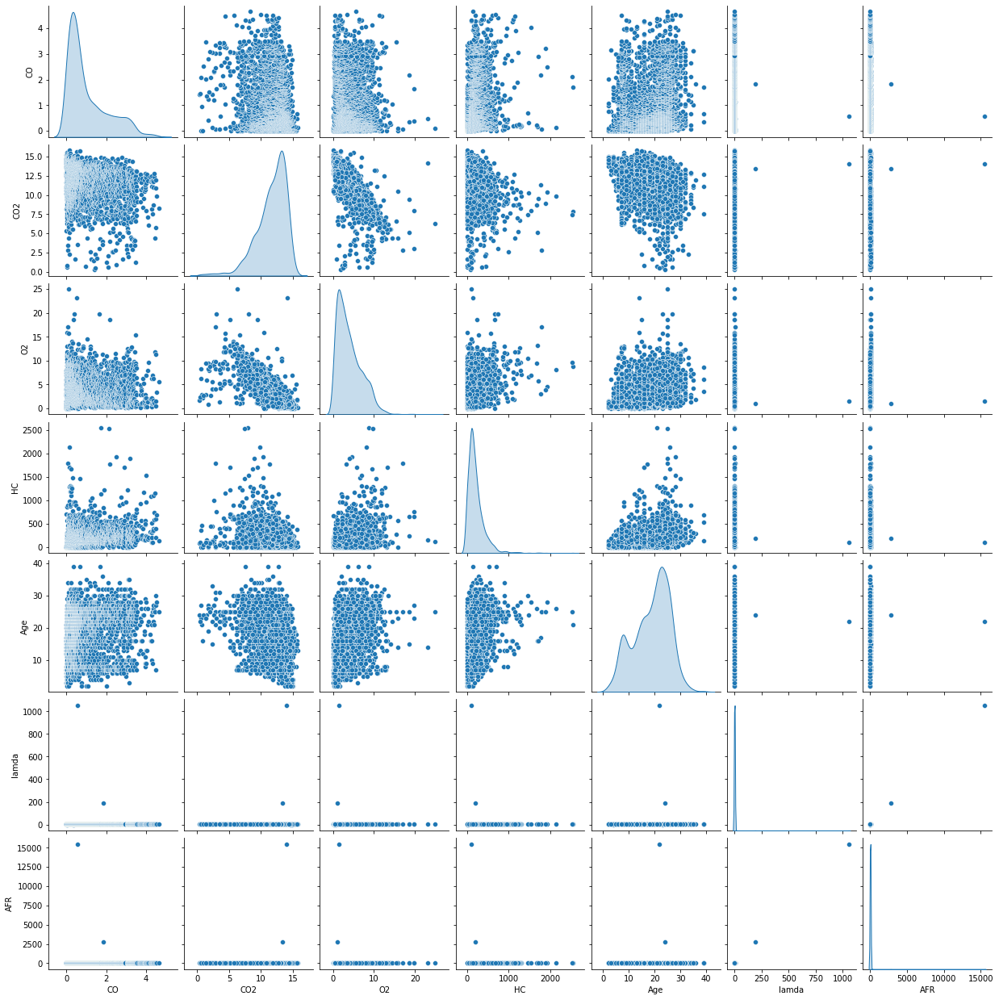

In [17]:
sns.pairplot(dataset[favCols], diag_kind='kde')

(array([ 14.,  13.,  21.,  37., 122., 286., 464., 724., 866., 217.]),
 array([ 0.3 ,  1.85,  3.4 ,  4.95,  6.5 ,  8.05,  9.6 , 11.15, 12.7 ,
        14.25, 15.8 ]),
 <BarContainer object of 10 artists>)

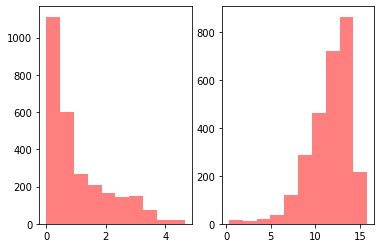

In [18]:
fig, ax = plt.subplots(1, 2)

ax[0].hist(dataset.CO, 10, facecolor='red', alpha=0.5, label="CO")
ax[1].hist(dataset.CO2, 10, facecolor='red', alpha=0.5, label="CO2")

# fig.subplots_adjust(left=0, right=1, bottom=0, top=0.5, hspace=0.05, wspace=1)


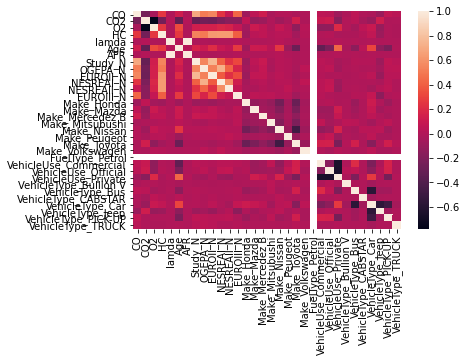

In [19]:
corr = dataset.iloc[:, 2:].corr()

sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)
plt.show()

In [20]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing

print(tf.__version__)

2.4.1


In [68]:
featureCols = ['CO2', 'CO', 'O2', 'HC', 'Study_N', 'Age', 'Make_Honda', 'Make_Mazda',
       'Make_Mercedez B', 'Make_Mitsubushi', 'Make_Nissan', 'Make_Peugeot',
       'Make_Toyota', 'Make_Volkswagen', 'FuelType_Petrol',
       'VehicleUse_Commercial', 'VehicleUse_Official', 'VehicleUse_Private',
       'VehicleType_Bullion V', 'VehicleType_Bus', 'VehicleType_CABSTAR',
       'VehicleType_Car', 'VehicleType_Jeep', 'VehicleType_PICK-UP',
       'VehicleType_TRUCK']
featureCols

In [71]:
# Import `train_test_split` from `sklearn.model_selection`
from sklearn.model_selection import train_test_split

# Specify the data 
dataX = dataset[featureCols].copy()

# 
X = dataX.copy()

# Isolate target labels
y = X.CO2

# Isolate data
X = X.drop('CO2', axis=1) 

# Split the data up in train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [72]:
from sklearn.preprocessing import StandardScaler

# Define the scaler 
scaler = StandardScaler().fit(X_train)

# Scale the train set
X_train = scaler.transform(X_train)

# Scale the test set
X_test = scaler.transform(X_test)

(M, N) = X_train.shape

In [73]:
# # Import `Sequential` from `keras.models`
# from keras.models import Sequential

# # Import `Dense` from `keras.layers`
# from keras.layers import Dense

# # Initialize the model
# model = Sequential()

# # Add input layer 
# model.add(Dense(64, input_dim=N, activation='relu'))

# model.add(Dense(64, activation='relu'))

# # Add output layer 
# model.add(Dense(1))

# from keras.optimizers import RMSprop
# rmsprop = RMSprop(lr=0.0001)

# model.compile(optimizer='rmsprop', loss='mse', metrics=['mae'])
# model.fit(X_train, y_train, epochs=100, verbose=1)


In [83]:

# Initialize the model
model = keras.Sequential([
    # Add input layer 
    layers.Dense(64, input_dim=N, activation='relu'),

    layers.Dense(64, activation='relu'),

    # Add output layer 
    layers.Dense(1)
    ])

rmsprop = keras.optimizers.RMSprop(lr=0.1)
adam = tf.optimizers.Adam(learning_rate=0.1)

# model.compile(optimizer='rmsprop', loss='mse', metrics=['mae'])
model.compile(optimizer=adam, loss='mse', metrics=['mae'])

history = model.fit(X_train, y_train, epochs=10, verbose=0)


In [84]:
# import numpy as np
# from sklearn.model_selection import StratifiedKFold

# seed = 7
# np.random.seed(seed)

# kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)
# for train, test in kfold.split(X, y):
    # model = Sequential()
    # model.add(Dense(64, input_dim=32, activation='relu'))
    # model.add(Dense(1))
    # model.compile(optimizer='rmsprop', loss='mse', metrics=['mae'])
    # model.fit(X[train], y[train], epochs=10, verbose=1)

In [89]:
from sklearn.metrics import r2_score

for i in range(5):
    model.fit(X_train, y_train, epochs=10, verbose=0)
    mse_value, mae_value = model.evaluate(X_test, y_test, verbose=0)

    y_pred = model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
        
    print(mse_value, mae_value, r2)

2.3471157550811768 0.873235285282135 0.5536676328146574
2.6281731128692627 1.0660486221313477 0.5002212739656
2.294766664505005 0.8662691712379456 0.5636224131589884
2.257546901702881 0.8412255644798279 0.5707002096181587
2.3483569622039795 0.9282403588294983 0.5534315977316621
